With ample help from:
- http://louistiao.me/posts/notebooks/embedding-matplotlib-animations-in-jupyter-as-interactive-javascript-widgets/
- https://jakevdp.github.io/blog/2012/08/18/matplotlib-animation-tutorial/

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML

Set up the figure, axis, and the plot element we want to animate:

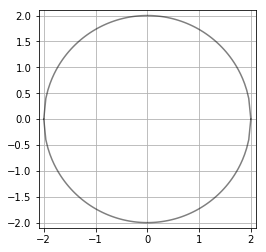

In [2]:
fig, ax = plt.subplots()

ax.set_aspect("equal")
ax.set_xlim((-2.1, 2.1))
ax.set_ylim((-2.1, 2.1))

ax.grid(True)

# Draw the circle on which the bob will be:
r = 2. #radius.
xline = np.linspace(-2, 2, 101)
yline1 = np.sqrt(r**2 - xline**2)
yline2 = -np.sqrt(r**2 - xline**2)
ax.plot(xline, yline1, "k-", alpha=0.5)
ax.plot(xline, yline2, "k-", alpha=0.5)

# Bob, string and text:
MyBob, = ax.plot([], [], "ro-", lw=2, zorder=2)
MyString, = ax.plot([], [], "k.-", lw=2, zorder=1)
MyText = ax.text(0, 0, '', transform=ax.transAxes)
# NOTE THE POSITION OF MyText!!!

Define the initialization function, which plots the background of each frame:

In [3]:
def init():
    MyBob.set_data([], [])
    MyString.set_data([], [])
    MyText.set_text('')
    return (MyBob, MyString, MyText)

Define the animation function, which is called for each new frame:

In [4]:
NumOfAnim = 200

In [5]:
def animate(i):
    x = i*r/NumOfAnim
    y = np.sqrt(r**2 - x**2)
    
    xData = np.array([0, x])
    yData = np.array([0, y])
    
    MyBob.set_data(x, y)
    MyString.set_data(xData, yData)
    MyText.set_text('x={:.2f}, y={:.2f}'.format(x, y))
    
    return (MyBob, MyString, MyText)

Compile the animation. Setting ```blit=True``` will only redraw parts that have changed:

In [6]:
anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=range(-NumOfAnim, NumOfAnim+1),
                               interval=20,
                               blit=True, repeat=False)

In [7]:
%%time
HTML(anim.to_jshtml())

CPU times: user 22.1 s, sys: 468 ms, total: 22.6 s
Wall time: 22.8 s
